#  STAT 301  Final Report

### Group Members: 

Pragya Singhal <br>
Helen He <br>
Zohane Bal <br>
Kenny Zhou


## Unveiling Melbourne's Housing Market Dynamics: 
### A Predictive Analysis during the 2016-2018 Bubble Period

### Loading Packages

In [1]:
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(dplyr)
library(broom)
library(ggplot2)
library(GGally)
library(MASS)
library(rsample)
library(leaps)
library(scales)


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select



Attaching package: ‘scales’


The following object is masked from ‘package:purrr’:

    discard


The following object is masked from ‘package:readr’:

    col_factor




## Reading Data into R

We read the data into R from the web 

In [2]:
data <- read.csv("https://raw.githubusercontent.com/HelenXuanye-He/STATS-301-PROJECT/31530efd259e32800656c74548b51d5070896578/Melbourne_housing_FULL.csv")
head(data)



,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,⋯,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<chr>,<chr>
1,Abbotsford,68 Studley St,2,h,NA,SS,Jellis,3/09/2016,2.5,3067,⋯,1,1,126,NA,NA,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019
2,Abbotsford,85 Turner St,2,h,1480000,S,Biggin,3/12/2016,2.5,3067,⋯,1,1,202,NA,NA,Yarra City Council,-37.7996,144.9984,Northern Metropolitan,4019
3,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,4/02/2016,2.5,3067,⋯,1,0,156,79,1900,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019
4,Abbotsford,18/659 Victoria St,3,u,NA,VB,Rounds,4/02/2016,2.5,3067,⋯,2,1,0,NA,NA,Yarra City Council,-37.8114,145.0116,Northern Metropolitan,4019
5,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,4/03/2017,2.5,3067,⋯,2,0,134,150,1900,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019
6,Abbotsford,40 Federation La,3,h,850000,PI,Biggin,4/03/2017,2.5,3067,⋯,2,1,94,NA,NA,Yarra City Council,-37.7969,144.9969,Northern Metropolitan,4019


# Introduction

The link to access the dataset through Kaggle: https://www.kaggle.com/datasets/anthonypino/melbourne-housing-market . 

The dataset "Melbourne Housing Market" sourced from Kaggle which captures a snapshot of house trades in Melbourne during 2016 to early 2018 known as house price bubble period. In that period, Melbourne’s traded houses’ prices were experiencing tremendous changes: first rose in an abnormal way, followed by a rapid decline. 

In this project, we will predominantly conducting predictive analysis to determine the specific factors that exert the most influence on property prices within the Melbourne housing market during the 16-18 bubble period. On top of this, we could also constructing inferential analysis to assess the impact of multiple factors on the house price simultaneously by using Multiple Linear Regression model. 

After a preliminary data cleaning phase, where we omitted the missing values in the explanatory variables:  `Car`, `Price`, `Distance`, `Bedroom2` and `Bathroom`, the effective population size (N) for this study stands at 20,423 traded houses. This refined dataset serves as the basis for the subsequent predictive modeling.


In the project, we are going to use `StepAIC` method than the other stepwise methods to perform variable selection, since the stepwise AIC method is a model selection method that can be easily managed and can be widely extended to more generalized models and applied to non normally distributed data.(Yamashita, 2007)

### Research Question 
How does the house prices (response variable) and the distance from the Melbourne CBD, the number of bathrooms, the number of bedrooms and the number of car spots (explanatory variables) correlated in Melbourne's housing market, and how does the explanatory variables collectively provide a better prediction of house prices?

## Key Variables 

|Variable Name|Description|Variable Type|
|-------------|-----------|----|
|`Price`|The price of the property in Australian dollars|Numerical variable|
|`Type`|The type of property: h,u,t. Where h stands for houses, cottages, villas, semis, terraces; u stands for apartments, duplex; t stands for townhouses|Categorical variable|
|`Method`| Methods of sale ,S - property sold; SP - property sold prior; PI - property passed in; PN - sold prior not disclosed; SN - sold not disclosed; NB - no bid; VB - vendor bid; W - withdrawn prior to auction; SA - sold after auction; SS - sold after auction price not disclosed | Categorical variable|
|`Distance`| The distance from the property to the Central Business District (CBD) of Melbourne, measured in kilometers| Numerical variable|
|`Rooms`| Number of rooms in the house| Numerical variable|
|`Bedroom2`| Number of bedrooms in the house | Numerical variable|
|`Bathroom`| Number of bathrooms in the house| Numerical variable|
|`Car`| Number of car spots| Numerical variable|
|`landsize`| Land Size in Metres| Numerical variable|
|`BuildingArea`| Building Size in Metres|Numerical variable|
|`YearBuilt`| Year the house was built|Numerical variable|
|`Regionname`| The general region where the property is located (e.g., West, North West, North, North East). |


# Methods and Results

## a) Exploratory Data Analysis

### Structure of the objects

In [3]:
str(data)

'data.frame':	34857 obs. of  21 variables:
 $ Suburb       : chr  "Abbotsford" "Abbotsford" "Abbotsford" "Abbotsford" ...
 $ Address      : chr  "68 Studley St" "85 Turner St" "25 Bloomburg St" "18/659 Victoria St" ...
 $ Rooms        : int  2 2 2 3 3 3 4 4 2 2 ...
 $ Type         : chr  "h" "h" "h" "u" ...
 $ Price        : int  NA 1480000 1035000 NA 1465000 850000 1600000 NA NA NA ...
 $ Method       : chr  "SS" "S" "S" "VB" ...
 $ SellerG      : chr  "Jellis" "Biggin" "Biggin" "Rounds" ...
 $ Date         : chr  "3/09/2016" "3/12/2016" "4/02/2016" "4/02/2016" ...
 $ Distance     : chr  "2.5" "2.5" "2.5" "2.5" ...
 $ Postcode     : chr  "3067" "3067" "3067" "3067" ...
 $ Bedroom2     : int  2 2 2 3 3 3 3 3 4 3 ...
 $ Bathroom     : int  1 1 1 2 2 2 1 2 1 2 ...
 $ Car          : int  1 1 0 1 0 1 2 2 2 1 ...
 $ Landsize     : int  126 202 156 0 134 94 120 400 201 202 ...
 $ BuildingArea : num  NA NA 79 NA 150 NA 142 220 NA NA ...
 $ YearBuilt    : int  NA NA 1900 NA 1900 NA 2014 2006 1

### Summary Statistics

In [4]:
data_summary <- summary(data) 
data_summary

    Suburb            Address              Rooms            Type          
 Length:34857       Length:34857       Min.   : 1.000   Length:34857      
 Class :character   Class :character   1st Qu.: 2.000   Class :character  
 Mode  :character   Mode  :character   Median : 3.000   Mode  :character  
                                       Mean   : 3.031                     
                                       3rd Qu.: 4.000                     
                                       Max.   :16.000                     
                                                                          
     Price             Method            SellerG              Date          
 Min.   :   85000   Length:34857       Length:34857       Length:34857      
 1st Qu.:  635000   Class :character   Class :character   Class :character  
 Median :  870000   Mode  :character   Mode  :character   Mode  :character  
 Mean   : 1050173                                                           
 3rd Qu.: 12950

### Removing NA Values

In [5]:
melbourne_housing <- na.omit(data)

head(melbourne_housing)
nrow(melbourne_housing)

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,⋯,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<chr>,<chr>
3,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,4/02/2016,2.5,3067,⋯,1,0,156,79,1900,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019
5,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,4/03/2017,2.5,3067,⋯,2,0,134,150,1900,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019
7,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,4/06/2016,2.5,3067,⋯,1,2,120,142,2014,Yarra City Council,-37.8072,144.9941,Northern Metropolitan,4019
12,Abbotsford,124 Yarra St,3,h,1876000,S,Nelson,7/05/2016,2.5,3067,⋯,2,0,245,210,1910,Yarra City Council,-37.8024,144.9993,Northern Metropolitan,4019
15,Abbotsford,98 Charles St,2,h,1636000,S,Nelson,8/10/2016,2.5,3067,⋯,1,2,256,107,1890,Yarra City Council,-37.8060,144.9954,Northern Metropolitan,4019
19,Abbotsford,10 Valiant St,2,h,1097000,S,Biggin,8/10/2016,2.5,3067,⋯,1,2,220,75,1900,Yarra City Council,-37.8010,144.9989,Northern Metropolitan,4019


[1] 8887

### Looking at Head & Tail of Data

In [6]:
data_head <- melbourne_housing %>% head(3)
data_tail <- melbourne_housing %>% tail(3)
data_head
data_tail

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,⋯,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<chr>,<chr>
3,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,4/02/2016,2.5,3067,⋯,1,0,156,79,1900,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019
5,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,4/03/2017,2.5,3067,⋯,2,0,134,150,1900,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019
7,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,4/06/2016,2.5,3067,⋯,1,2,120,142,2014,Yarra City Council,-37.8072,144.9941,Northern Metropolitan,4019


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,⋯,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<chr>,<chr>
34854,Yarraville,29A Murray St,2,h,888000,SP,Sweeney,24/02/2018,6.3,3013,⋯,2,1,98,104,2018,Maribyrnong City Council,-37.81551,144.8883,Western Metropolitan,6543
34855,Yarraville,147A Severn St,2,t,705000,S,Jas,24/02/2018,6.3,3013,⋯,1,2,220,120,2000,Maribyrnong City Council,-37.82286,144.8786,Western Metropolitan,6543
34857,Yarraville,3 Tarrengower St,2,h,1020000,PI,RW,24/02/2018,6.3,3013,⋯,1,0,250,103,1930,Maribyrnong City Council,-37.81810,144.8935,Western Metropolitan,6543


### Exploring the Data with Visualisations

#### Price by Property Type

`geom_smooth()` using formula = 'y ~ x'


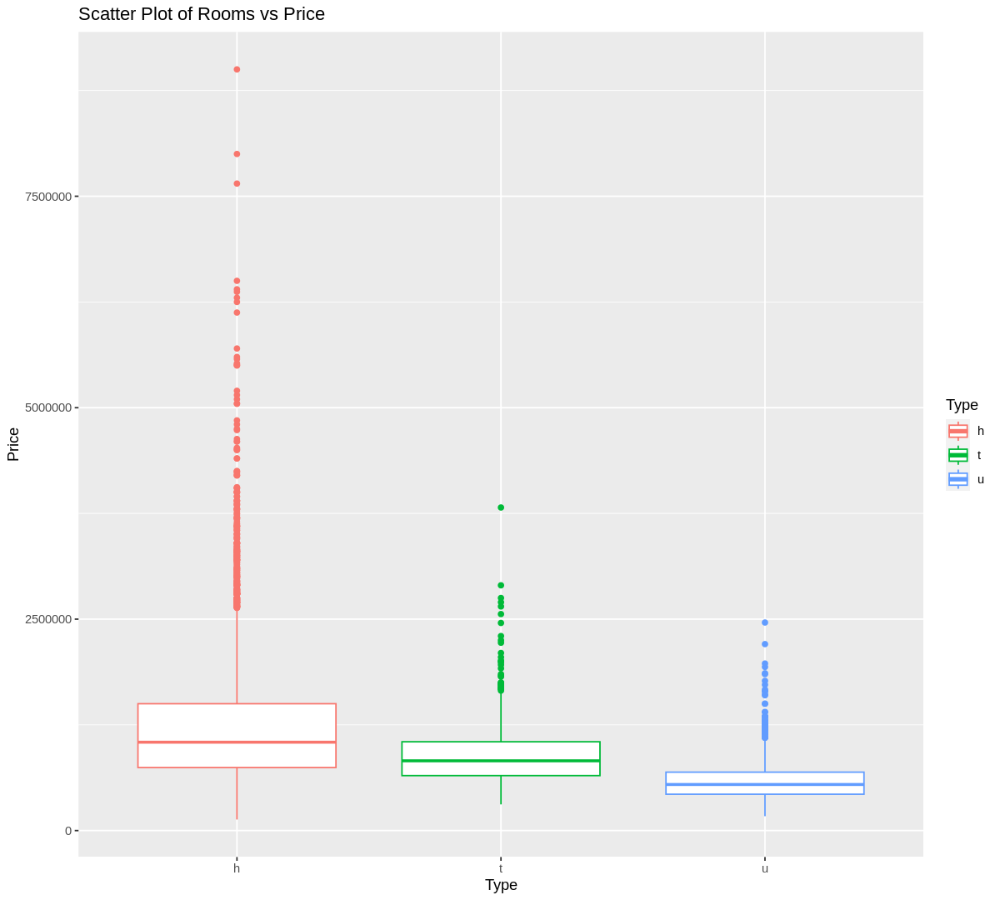

In [7]:
options(repr.plot.width = 10, repr.plot.height = 9)

bathroom_vs_price <- ggplot(melbourne_housing, aes(x = Type, y = Price, color = Type)) +
    geom_boxplot() + 
    geom_smooth(method = lm, se = FALSE, linewidth = 1.5) + 
    labs(title = "Scatter Plot of Rooms vs Price", x = "Type", y = "Price")

bathroom_vs_price 

> Among the property types depicted, houses command the highest median price of around 180K AUD, with several outliers reaching well beyond 750K AUD, indicating exceptional high-priced properties. In contrast, town and unit properties show lower medians and fewer extreme outliers, suggesting a more constrained price range and fewer exceptionally high-priced instances.

#### Number of Bathrooms vs. Price by Type

$x
[1] "Rooms"

$y
[1] "Price"

$title
[1] "Scatter Plot of Rooms vs Price"

attr(,"class")
[1] "labels"

`geom_smooth()` using formula = 'y ~ x'


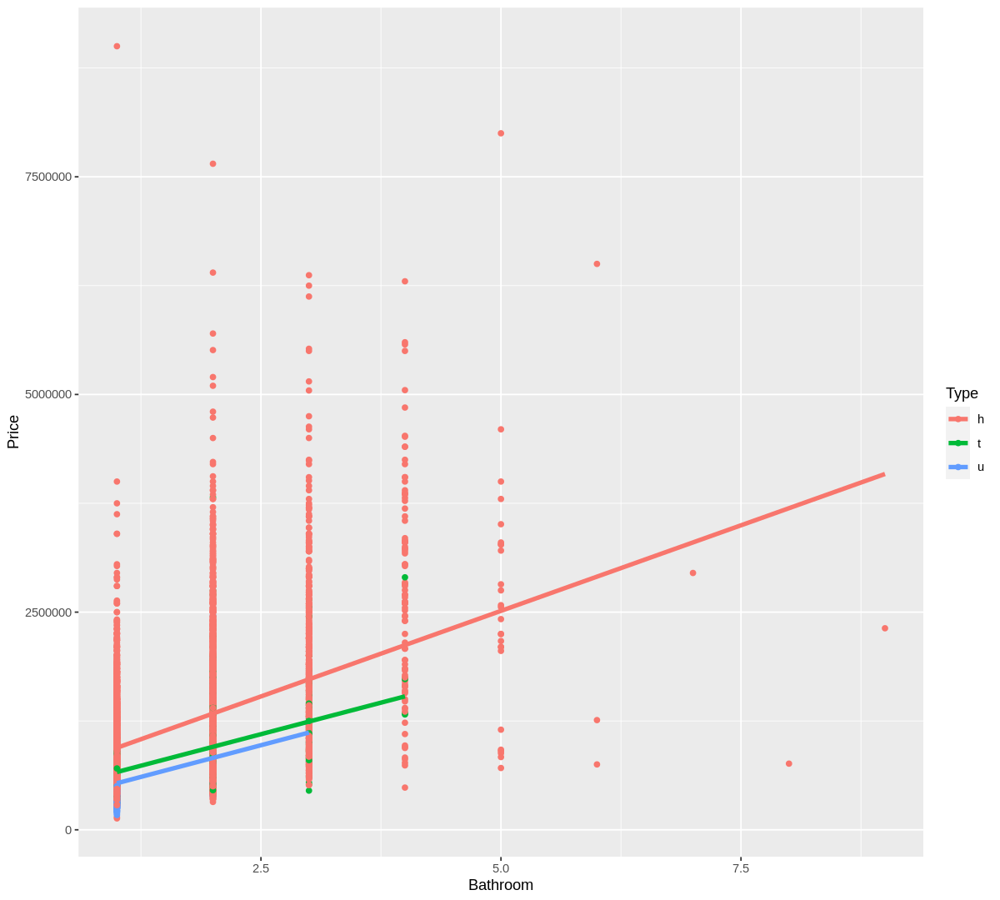

In [8]:
options(repr.plot.width = 10, repr.plot.height = 9)

bathroom_vs_price <- ggplot(melbourne_housing, aes(x = Bathroom, y = Price, color = Type)) +
  geom_point() +
  geom_smooth(method = lm, se = FALSE, linewidth = 1.5)
  labs(title = "Scatter Plot of Rooms vs Price", x = "Rooms", y = "Price")

bathroom_vs_price 

#### Linear Correlation Coefficient

In [9]:
cor(melbourne_housing$Price, melbourne_housing$Bathroom)

[1] 0.463501

> The plot offers insights into the relationship between the number of rooms in Melbourne housing and their prices, aiding in understanding whether a linear or non-linear correlation exists. On average, the price tends to increase with the number of bedrooms, aligning with our initial expectation of a linearly increasing trend. The calculated linear correlation coefficient between price and distance is 0.463, suggesting a weak positive correlation between these variables.

> Additionally, the 'Type' variable is represented by color in the scatter plot, effectively distinguishing among the three property types visually. This visualization quickly illustrates the distribution of different property types concerning the number of rooms and their respective prices. From the plot, we can infer that a majority of the housing in Melbourne are defined by the type 'Houses' and also have a higher price range than the others, which was also inferred from the previous boxplot.

#### Number of Bedrooms vs Price by Type

$x
[1] "Rooms"

$y
[1] "Price"

$title
[1] "Scatter Plot of Rooms vs Price"

attr(,"class")
[1] "labels"

`geom_smooth()` using formula = 'y ~ x'


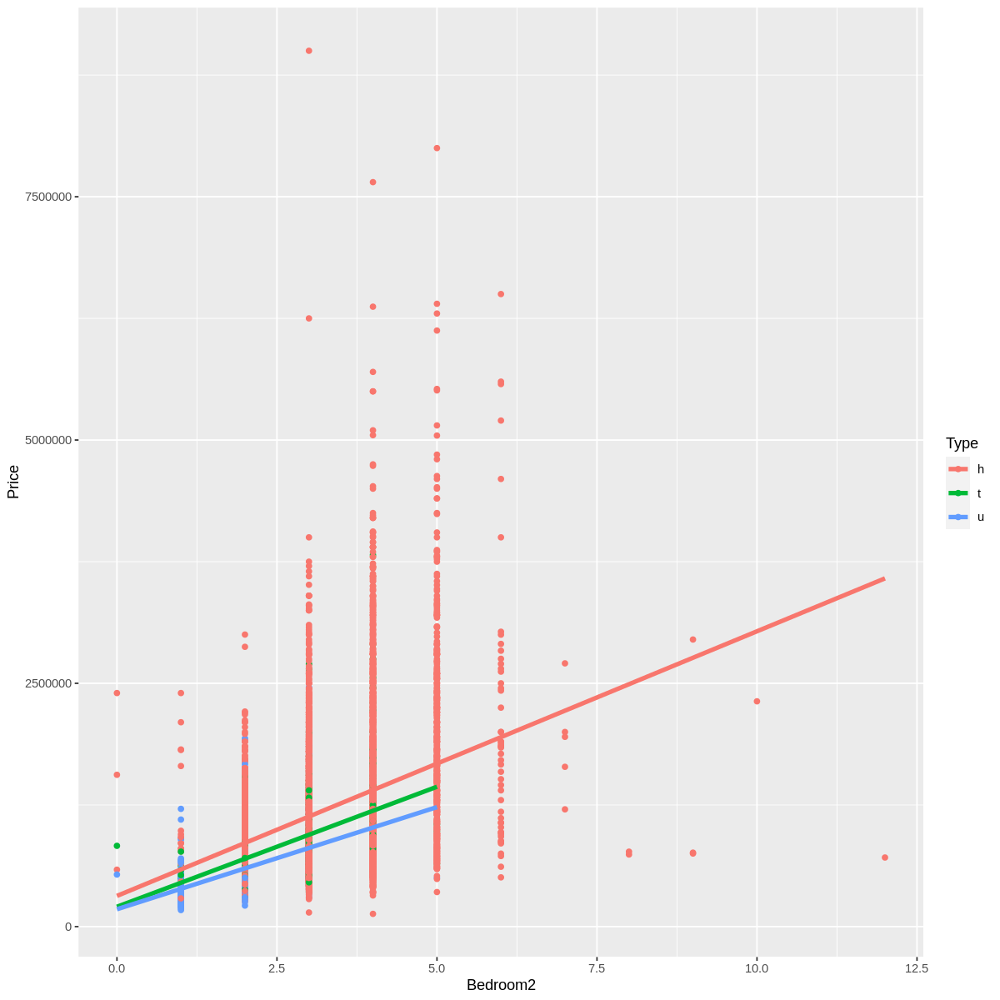

In [18]:
options(repr.plot.width = 10, repr.plot.height = 10)

bedroom_vs_price <- ggplot(melbourne_housing, aes(x = Bedroom2, y = Price, color = Type)) +
  geom_point() +
  geom_smooth(method = lm, se = FALSE, linewidth = 1.5)
  labs(title = "Scatter Plot of Rooms vs Price", x = "Rooms", y = "Price")

bedroom_vs_price 

#### Linear Correlation Coefficient

In [11]:
cor(melbourne_housing$Price, melbourne_housing$Bedroom2)

[1] 0.4608804

> From the above plot, there is a clear increasing trend observed as the number of bedrooms in a house increases, correlating with a rise in housing prices. This relationship is supported by a moderate positive linear correlation coefficient of 0.433 between the price and the number of bedrooms. 

> Examining the data distribution reveals interesting patterns: a clustering of data points occurs at lower bedroom counts, while houses with more than eight bedrooms show a wider spread. Notably, there's considerable price variability among houses with 4-5 bedrooms, indicating that the fitted linear regression line doesn't fully capture this diversity in prices. Despite the general trend aligning with the common notion that more bedrooms usually mean higher prices, exceptions exist. 

> Moreover, the scatter plot's use of color to represent the 'Type' variable effectively distinguishes among different property types, facilitating a quick understanding of their distribution based on room count and prices. This visualization highlights that a majority of Melbourne's housing is categorized as 'Houses,' which tend to command higher prices compared to other property types

#### Distance to Central Business District (CBD) vs. House Price in Melbourne

`geom_smooth()` using formula = 'y ~ x'


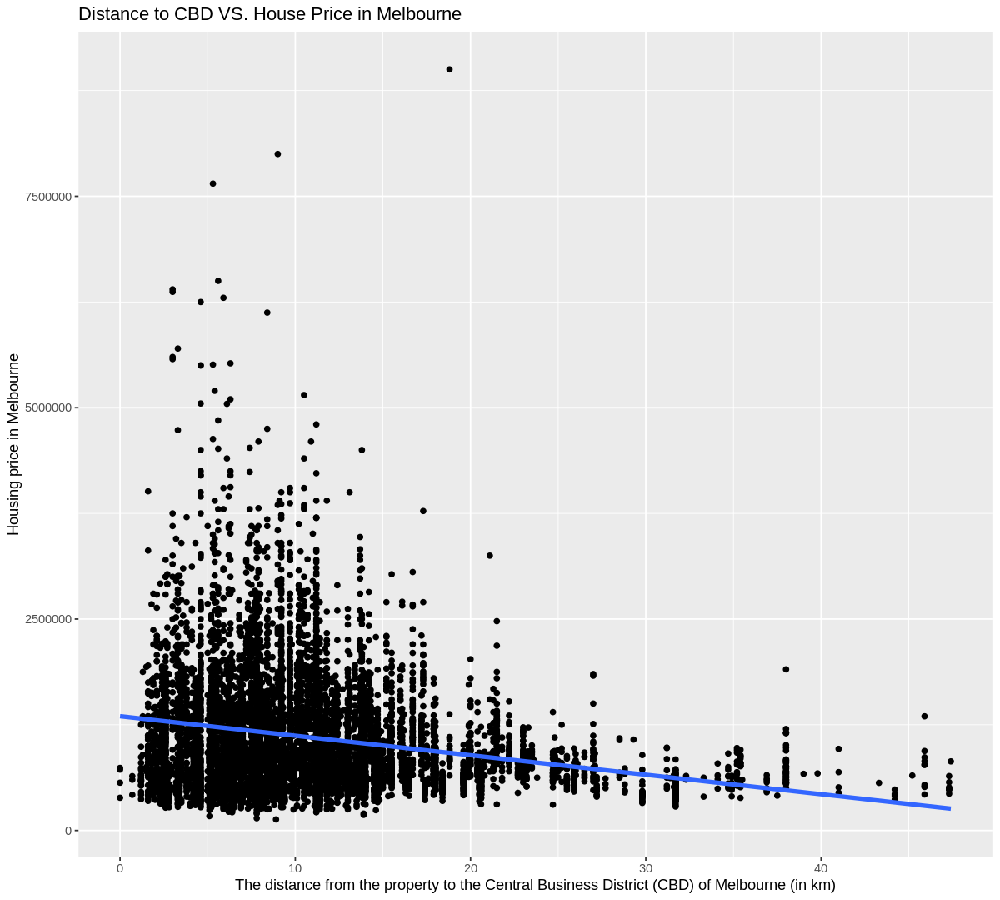

In [12]:
options(repr.plot.width = 10, repr.plot.height = 9)
melbourne_housing$Distance <- as.double(melbourne_housing$Distance)

PriceVSDistance <- ggplot(data=melbourne_housing, aes(x=Distance, y=Price)) + 
    geom_point() + 
    geom_smooth(method = lm, se = FALSE, linewidth = 1.5) +
    xlab("The distance from the property to the Central Business District (CBD) of Melbourne (in km)") +
    ylab("Housing price in Melbourne") +
    ggtitle("Distance to CBD VS. House Price in Melbourne")
PriceVSDistance

#### Linear Correlation Coefficient

In [13]:
cor(melbourne_housing$Price, melbourne_housing$Distance)

[1] -0.2312117

> The plot above reveals a noticeable decreasing trend: as the distance from Melbourne's Central Business District (CBD) increases, housing prices tend to decline. This relationship is supported by a weak negative linear correlation coefficient of -0.231 between the price and distance variables. The observed trend aligns with the general understanding that properties closer to the CBD typically command higher prices, a notion that seems logical and often serves as a reliable predictor. However, as with any trend, there are occasional deviations or exceptions.

#### Number of Car Spots vs. Price

`geom_smooth()` using formula = 'y ~ x'


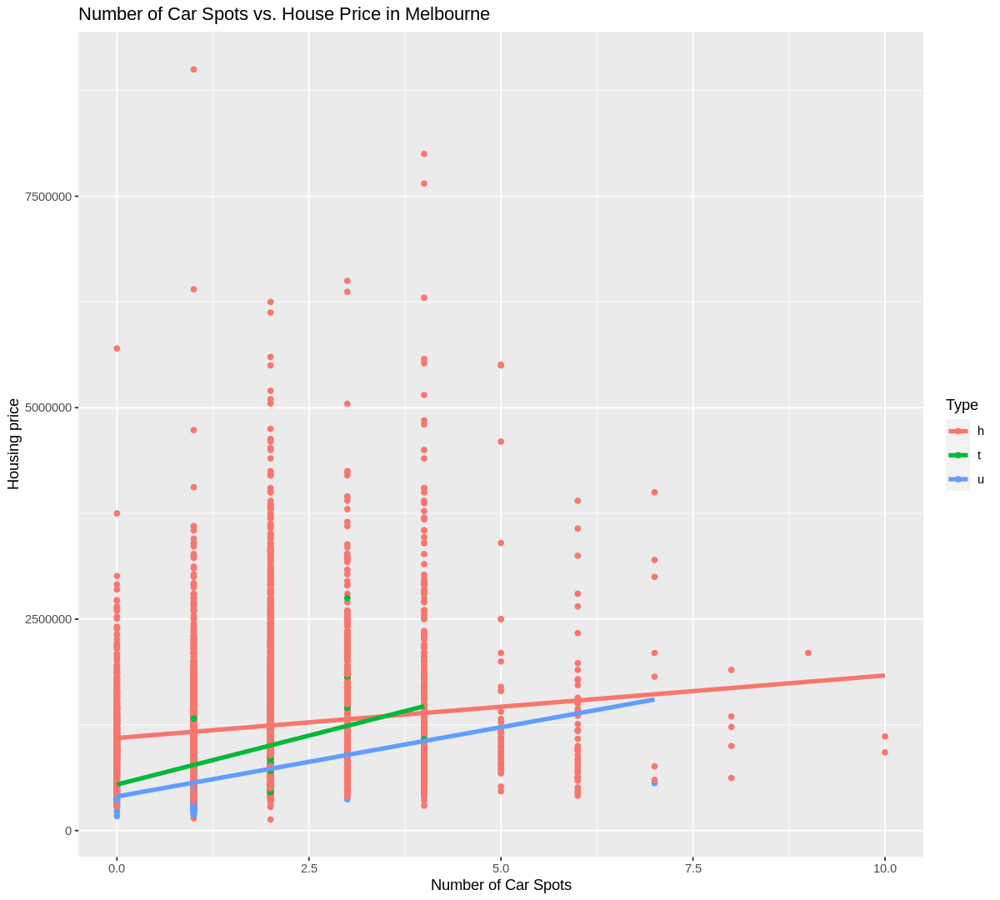

In [14]:
options(repr.plot.width = 10, repr.plot.height = 9)

PriceVSCar <- ggplot(data=melbourne_housing, aes(x=Car, y=Price, color = Type)) + 
    geom_point() + 
    geom_smooth(method = lm, se = FALSE, linewidth = 1.5) +
    xlab("Number of Car Spots")+
    ylab("Housing price")+
    ggtitle("Number of Car Spots vs. House Price in Melbourne")
PriceVSCar

#### Linear Correlation Coefficent

In [15]:
cor(melbourne_housing$Price, melbourne_housing$Car)

[1] 0.2094641

> The presented plot highlights a notable trend: an increase in the number of parking spaces in a house tends to correlate with higher housing prices, supported by a weak positive linear correlation coefficient of 0.209 between price and the quantity of car spots. However, within the 1-6 car spot range, numerous outliers are apparent. These outliers likely indicate properties possessing distinct characteristics or amenities that significantly impact their value, surpassing the typical influence attributed solely to parking availability. Notably, property type plays a significant role; 'House' type residences show more deviations from the expected trend, suggesting that property type strongly influences market value, even beyond the influence of available car spots.

#### Boxplot comparison of property prices by Melbourne region

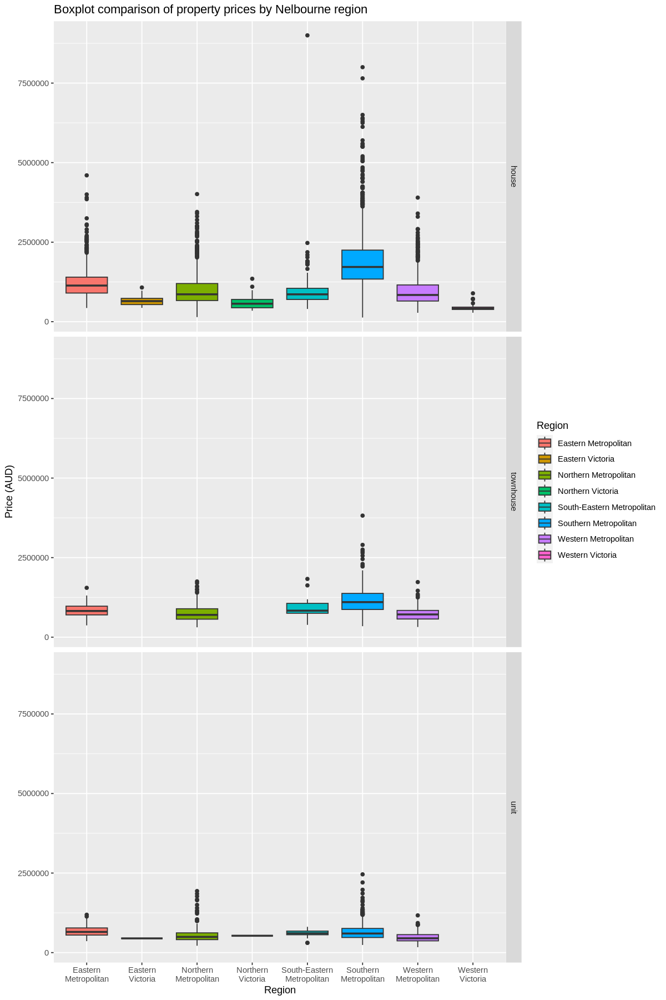

In [16]:
options(repr.plot.width = 10, repr.plot.height = 15)
house_prices_by_region_and_type_plot <- ggplot(melbourne_housing, aes(x = Regionname, y = Price, fill = Regionname)) + 
    geom_boxplot() + 
    facet_grid(rows = "Type", labeller = as_labeller(c(h = "house", t = "townhouse", u = "unit"))) +
    labs(x = "Region", y = "Price (AUD)", title = "Boxplot comparison of property prices by Nelbourne region", fill = "Region") +
    scale_x_discrete(labels = wrap_format(10))
house_prices_by_region_and_type_plot

> This box plot illustrates housing price distributions across various regions, serving as a valuable tool to discern price disparities among regions based on property types, a crucial factor in predicting housing prices. Notably, 'unit' property types exhibit minimal price variation across regions, with occasional outliers observed in the southern and northern metropolitan areas, where unit prices soar to 250K AUD in the Southern Metropolitan region.

>In contrast, 'house' property types display more price diversity across regions. For instance, the Southern Metropolitan area notably contains a cluster of houses priced between 200K-250K AUD, with the median falling within this range. Other regions typically showcase median prices below 200K AUD, with Northern Victoria hosting the most affordable properties across all property types.

>The Southern Metropolitan region stands out for its higher-priced properties, with outliers surpassing 750K AUD. This explanatory variable significantly influences property price fluctuations and serves as a potential area of exploration in order to look for more affordable housing options elsewhere.

### b) Methods: Plan

**Implementation of a proposed model**

In [17]:
model <- lm(Price ~ Distance + Bathroom + Bedroom2 + Car, data = housing)
model

ERROR: Error in eval(predvars, data, env): object 'Price' not found


In [ ]:
summary(model)

In [ ]:
full.model <- lm(Price ~ ., data = housing)

In [ ]:
stepwise.model <- stepAIC(full.model, direction = "both")

In [ ]:
summary(stepwise.model)

In [ ]:
set.seed(1234)
Housing_split <- initial_split(housing, prop = 0.7, strata = Price)
training_Housing <- training(Housing_split)
testing_Housing <- testing(Housing_split)

Housing_stepwise <- regsubsets(
  x = Price ~ Distance*Bedroom2*Bathroom*Car,  
  data = training_Housing,
  method = "seqrep",  
)

housing_stepwise_summary <- summary(Housing_stepwise)
##

In [ ]:
housing_stepwise_summary_df <- tibble(
    RSQ = housing_stepwise_summary$rsq,
    RSS = housing_stepwise_summary$rss,
    ADJ.R2 = housing_stepwise_summary$adjr2,
    Cp = housing_stepwise_summary$cp,
    BIC = housing_stepwise_summary$bic
)
housing_stepwise_summary_df

In [ ]:
cp_min = which.min(housing_stepwise_summary$cp) 
selected_var <- names(coef(Housing_stepwise, cp_min))[-1]
selected_var

In [ ]:
model <- lm(Price ~ Bedroom2 +Bedroom2:Bathroom +Bathroom:Car + 
            Distance:Bedroom2:Bathroom+ Distance:Bedroom2:Car + 
            Distance:Bathroom:Car +Bedroom2:Bathroom:Car+Distance:Bedroom2:Bathroom:Car, 
            data = training_Housing)
summary(model)

In [ ]:
library(caret)

outer_control <- trainControl(method = "cv", number = 5)
outer_results <- data.frame(fold = integer(0), rmse = numeric(0))


set.seed(123)
outer_folds <- createFolds(housing$Price, k = 5)


fold_index <- 1
for (fold in outer_folds) {
  training <- housing[-fold, ]
  testing <- housing[fold, ]
  

  inner_control <- trainControl(method = "cv", number = 5)

  model <- train(Price ~ ., data = training, method = "lm", trControl = inner_control)
  
  predictions <- predict(model, newdata = testing)
  
  rmse <- sqrt(mean((testing$Price - predictions)^2))
  
  outer_results <- rbind(outer_results, data.frame(fold = fold_index, rmse = rmse))
  fold_index <- fold_index + 1
}

print(outer_results)

average_rmse <- mean(outer_results$rmse)

In [ ]:
training_rmse <- sqrt(mean((training_Housing$Price - predict(model, training_Housing))^2))
test_rmse <- sqrt(mean((testing_Housing$Price - predict(model, testing_Housing))^2))

In [ ]:
rmse_report <- tibble(
  Dataset = c("Training", "5-fold Validation", "Testing"),
  RMSE = c(training_rmse, average_rmse, test_rmse)
)

print(rmse_report)

**Interpretation**
- The minimal difference between the training, validation, and testing RMSEs suggests that the model selection effectively mitigated the risk of overfitting.
- The average RSME of testing model is 518899. The slightly lower RMSE in the testing dataset could be attributed to chance from considering the small margin of difference.

# Discussion

# References

- Yamashita, T. (2007). A stepwise AIC method for variable selection in linear regression. A Stepwise AIC Method for Variable Selection in Linear Regression. https://www.tandfonline.com/doi/full/10.1080/03610920701215639 Accessed 7 Dec. 2023.

- Pino, Tony. “Melbourne Housing Market.” Www.kaggle.com, 14 Oct. 2018, www.kaggle.com/datasets/anthonypino/melbourne-housing-market. Accessed 7 Dec. 2023.
